### Coleta e Pré Processamento de Dados

In [ ]:
import subprocess
import os

def separar_video_e_audio(caminho_video_entrada):
    """
    Extrai o vídeo sem áudio e o áudio de um arquivo de vídeo, salvando-os em arquivos separados.

    Parâmetros:
    caminho_video_entrada (str): Caminho do arquivo de vídeo de entrada.
    
    O script executa dois comandos FFmpeg:
    1. Extrai o vídeo sem áudio e o salva em um arquivo de saída.
    2. Extrai o áudio e o salva em um arquivo de saída.
    
    Caso algum erro aconteça ao executar o comando FFmpeg, é capturado e impresso.
    """
    # Cria o diretório de saída se não existir
    diretorio_saida = os.path.dirname(caminho_video_entrada)
    if not os.path.exists(diretorio_saida):
        os.makedirs(diretorio_saida)

    nome_base, extensao = os.path.splitext(caminho_video_entrada)
    
    # Define os caminhos de saída para o vídeo e áudio
    caminho_video_saida = f"{nome_base}_video_only{extensao}"
    caminho_audio_saida = f"{nome_base}_audio_only.aac"

    # Comando FFmpeg para extrair o vídeo sem áudio
    comando_video = [
        "ffmpeg",
        "-y",  # Sobrescrever arquivos de saída sem perguntar
        "-i", caminho_video_entrada,  # Arquivo de entrada
        "-c:v", "copy",  # Copiar o codec de vídeo
        "-an",  # Desabilitar áudio
        caminho_video_saida  # Arquivo de saída para o vídeo
    ]
    
    # Comando FFmpeg para extrair o áudio
    comando_audio = [
        "ffmpeg",
        "-y",  # Sobrescrever arquivos de saída sem perguntar
        "-i", caminho_video_entrada,  # Arquivo de entrada
        "-vn",  # Desabilitar vídeo
        "-c:a", "copy",  # Copiar o codec de áudio
        caminho_audio_saida  # Arquivo de saída para o áudio
    ]

    print(f"Executando comando para vídeo: {' '.join(comando_video)}")
    try:
        subprocess.run(comando_video, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        print(f"Vídeo sem áudio salvo em: {caminho_video_saida}")
    except subprocess.CalledProcessError as e:
        print(f"Erro ao extrair o vídeo: {e.stderr.decode()}")
        print(f"Comando executado: {' '.join(e.cmd)}")
    except FileNotFoundError:
        print("Erro: FFmpeg não encontrado. Certifique-se de que está instalado e no PATH.")


    print(f"\nExecutando comando para áudio: {' '.join(comando_audio)}")
    try:
        subprocess.run(comando_audio, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        print(f"Áudio salvo em: {caminho_audio_saida}")
    except subprocess.CalledProcessError as e:
        print(f"Erro ao extrair o áudio: {e.stderr.decode()}")
        print(f"Comando executado: {' '.join(e.cmd)}")
    except FileNotFoundError:
        print("Erro: FFmpeg não encontrado. Certifique-se de que está instalado e no PATH.")


if __name__ == "__main__":
    print("Iniciando script...")
    caminho_do_seu_video = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611.mp4"
    if os.path.exists(caminho_do_seu_video):
        print(f"\nProcessando vídeo: {caminho_do_seu_video}")
        separar_video_e_audio(caminho_do_seu_video)
    else:
        print(f"\nERRO: O arquivo '{caminho_do_seu_video}' não foi encontrado.")
        print("Verifique se o caminho está correto.")

Iniciando script...

Processando vídeo: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611.mp4
Executando comando para vídeo: ffmpeg -y -i /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611.mp4 -c:v copy -an /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611_video_only.mp4
Vídeo sem áudio salvo em: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611_video_only.mp4

Executando comando para áudio: ffmpeg -y -i /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611.mp4 -vn -c:a copy /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611_audio_only.aac
Áudio salvo em: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611_audio_only.aac


### Armazenamento e Tratamento de Imagens

In [ ]:
import cv2
import os
import sqlite3
from astropy.io import fits
from datetime import datetime
import numpy as np

# --- Definição da função para extrair, armazenar FITS e SQLite ---
def processar_video_e_armazenar_frames(caminho_video_somente_video, diretorio_saida_frames, db_path):
    """
    Extrai frames de um vídeo sem áudio em intervalos regulares, armazena cada frame em 
    arquivos FITS com metadados no cabeçalho e registra informações em um banco de dados SQLite.

    Args:
        caminho_video_somente_video (str): Caminho para o vídeo de entrada (somente vídeo).
        diretorio_saida_frames (str): Diretório onde os arquivos FITS dos frames serão salvos.
        db_path (str): Caminho do arquivo de banco de dados SQLite onde os metadados serão armazenados.

    Funcionalidade principal:
        - Lê o vídeo frame a frame com OpenCV.
        - Extrai frames a cada 100 ms.
        - Converte os frames para RGB (se necessário).
        - Salva os frames em formato FITS com cabeçalhos personalizados.
        - Insere os metadados dos frames no banco de dados SQLite.
    """
    # Verifica se o caminho do vídeo existe
    if not os.path.exists(caminho_video_somente_video):
        print(f"ERRO: O arquivo de vídeo '{caminho_video_somente_video}' não foi encontrado.")
        return

    # Cria o diretório de saída para os frames se não existir
    if not os.path.exists(diretorio_saida_frames):
        os.makedirs(diretorio_saida_frames)
        print(f"Diretório de saída para frames criado: {diretorio_saida_frames}")

    # Conecta ao banco de dados SQLite
    conn = sqlite3.connect(db_path)
    cursor = conn.cursor()

    # Cria a tabela de frames se ela não existir
    cursor.execute("""
        CREATE TABLE IF NOT EXISTS frames (
            id INTEGER PRIMARY KEY AUTOINCREMENT,
            timestamp_extracao TEXT,
            numero_frame INTEGER,
            tempo_ms_video REAL,
            caminho_fits TEXT UNIQUE
        )
    """)
    conn.commit()
    print(f"Banco de dados SQLite conectado e tabela 'frames' verificada/criada em: {db_path}")

    # Abre o arquivo de vídeo
    cap = cv2.VideoCapture(caminho_video_somente_video)
    
    if not cap.isOpened():
        print(f"ERRO: Não foi possível abrir o vídeo '{caminho_video_somente_video}'.")
        conn.close()
        return

    fps = cap.get(cv2.CAP_PROP_FPS)
    if fps == 0:
        print("Aviso: FPS do vídeo é zero. Usando um valor padrão de 30 FPS.")
        fps = 30.0

    intervalo_ms = 100 # Intervalo de extração em milissegundos
    frame_count = 0
    frames_extraidos = 0

    print(f"Iniciando extração de frames a cada {intervalo_ms} ms...")
    
    # Loop para ler frames do vídeo
    while True:
        current_pos_ms = cap.get(cv2.CAP_PROP_POS_MSEC)

        if frames_extraidos > 0 and current_pos_ms < (frames_extraidos * intervalo_ms - (intervalo_ms / 2)):
             target_pos_ms = frames_extraidos * intervalo_ms
             cap.set(cv2.CAP_PROP_POS_MSEC, target_pos_ms)
             ret, frame = cap.read()
             if not ret:
                 break
             current_pos_ms = cap.get(cv2.CAP_PROP_POS_MSEC)
        else:
            ret, frame = cap.read()


        if not ret:
            break

        target_extraction_time_ms = frames_extraidos * intervalo_ms
        if abs(current_pos_ms - target_extraction_time_ms) < (intervalo_ms / 2):

            if frame.shape[-1] == 3:
                frame_data = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            else:
                 frame_data = frame


            timestamp_atual = datetime.now().strftime("%Y%m%d_%H%M%S_%f")[:-3]
            nome_arquivo_fits = f"frame_{frames_extraidos:05d}_{timestamp_atual}.fits"
            caminho_arquivo_fits = os.path.join(diretorio_saida_frames, nome_arquivo_fits)

            # Cria o Cabeçalho FITS com metadados
            hdu = fits.PrimaryHDU(frame_data)
            hdu.header['FRM_NUM'] = frames_extraidos, 'Frame sequence number'
            hdu.header['TIME_MS'] = cap.get(cv2.CAP_PROP_POS_MSEC), 'Frame time in video (ms)'
            hdu.header['EXTR_TS'] = datetime.now().isoformat(), 'Extraction timestamp (ISO 8601)'
            hdu.header['SOURCE'] = os.path.basename(caminho_video_somente_video), 'Original video filename'
            hdu.header['WIDTH'] = frame_data.shape[1], 'Image width (pixels)'
            hdu.header['HEIGHT'] = frame_data.shape[0], 'Image height (pixels)'
            if frame_data.ndim == 3:
                hdu.header['CHANNELS'] = frame_data.shape[2], 'Number of color channels'
            else:
                 hdu.header['CHANNELS'] = 1, 'Number of channels (grayscale)'
            
            # salva o arquivo FITS e insere os metadados no banco de dados
            try:
                hdu.writeto(caminho_arquivo_fits, overwrite=True)
                cursor.execute(
                    "INSERT INTO frames (timestamp_extracao, numero_frame, tempo_ms_video, caminho_fits) VALUES (?, ?, ?, ?)",
                    (datetime.now().isoformat(), frames_extraidos, cap.get(cv2.CAP_PROP_POS_MSEC), caminho_arquivo_fits)
                )
                conn.commit()
                frames_extraidos += 1
                if frames_extraidos % 100 == 0:
                    print(f"Extracted {frames_extraidos} frames...")
            except Exception as e:
                print(f"Erro ao salvar FITS ou inserir no DB para frame {frames_extraidos}: {e}")

        frame_count += 1

    cap.release()
    conn.close()

    print(f"\nExtração concluída. Total de frames processados: {frame_count}")
    print(f"Total de frames extraídos e salvos (FITS + DB): {frames_extraidos}")
    print(f"Frames FITS salvos em: {diretorio_saida_frames}")
    print(f"Banco de dados SQLite salvo em: {db_path}")

caminho_video_para_processar = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611.mp4"
diretorio_saida_frames = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/frames_fits/"
db_caminho = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/frames_metadata.db"

processar_video_e_armazenar_frames(caminho_video_para_processar, diretorio_saida_frames, db_caminho)

try:
    conn_check = sqlite3.connect(db_caminho)
    cursor_check = conn_check.cursor()
    cursor_check.execute("SELECT COUNT(*) FROM frames")
    count = cursor_check.fetchone()[0]
    print(f"\nTotal de registros na tabela 'frames' do DB: {count}")
    conn_check.close()
except Exception as e:
    print(f"Erro ao verificar o DB: {e}")

try:
    if os.path.exists(diretorio_saida_frames) and os.listdir(diretorio_saida_frames):
        primeiro_fits = os.path.join(diretorio_saida_frames, os.listdir(diretorio_saida_frames)[0])
        with fits.open(primeiro_fits) as hdul:
            print(f"\nExemplo de cabeçalho do primeiro arquivo FITS ({os.path.basename(primeiro_fits)}):")
            print(repr(hdul[0].header))
except Exception as e:
    print(f"Erro ao verificar arquivo FITS de exemplo: {e}")

print("--- Etapa (b) Armazenamento e Tratamento de Imagens concluída! ---")

Banco de dados SQLite conectado e tabela 'frames' verificada/criada em: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/frames_metadata.db
Iniciando extração de frames a cada 100 ms...
Extracted 100 frames...
Extracted 200 frames...
Extracted 300 frames...

Extração concluída. Total de frames processados: 319
Total de frames extraídos e salvos (FITS + DB): 319
Frames FITS salvos em: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/frames_fits/
Banco de dados SQLite salvo em: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/frames_metadata.db

Total de registros na tabela 'frames' do DB: 319

Exemplo de cabeçalho do primeiro arquivo FITS (frame_00138_20250730_074248_976.fits):
SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    3 / number of array dimensions

### Analise e Processamento de Imagens

Total de 319 frames encontrados no banco de dados para processamento.
Iniciando análise e processamento de 319 frames...
Serão plotados os frames com os seguintes índices: [0, 79, 159, 239, 318]

--- Plotando e analisando Frame 0 (Tempo: 0.00s) ---


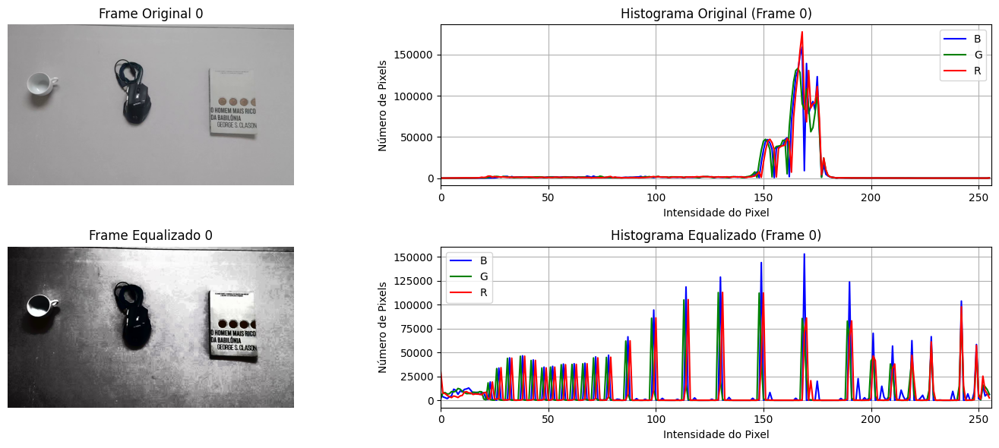


--- Plotando e analisando Frame 79 (Tempo: 7.89s) ---


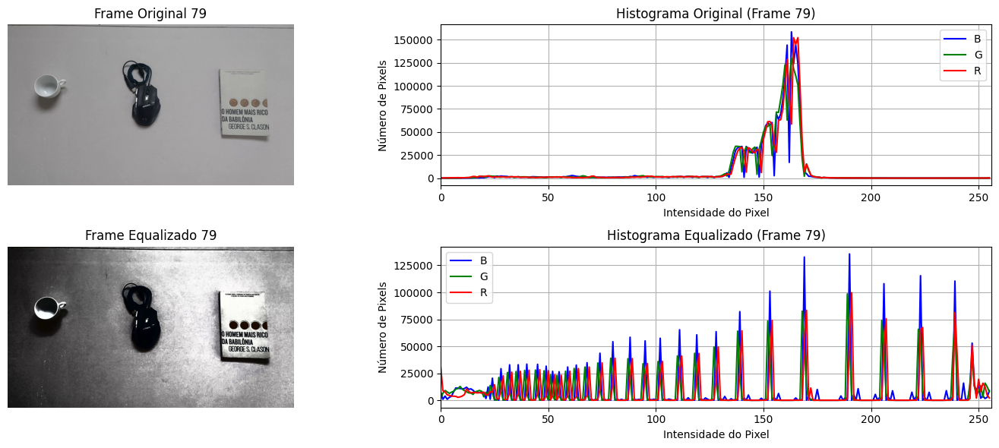


--- Plotando e analisando Frame 159 (Tempo: 15.88s) ---


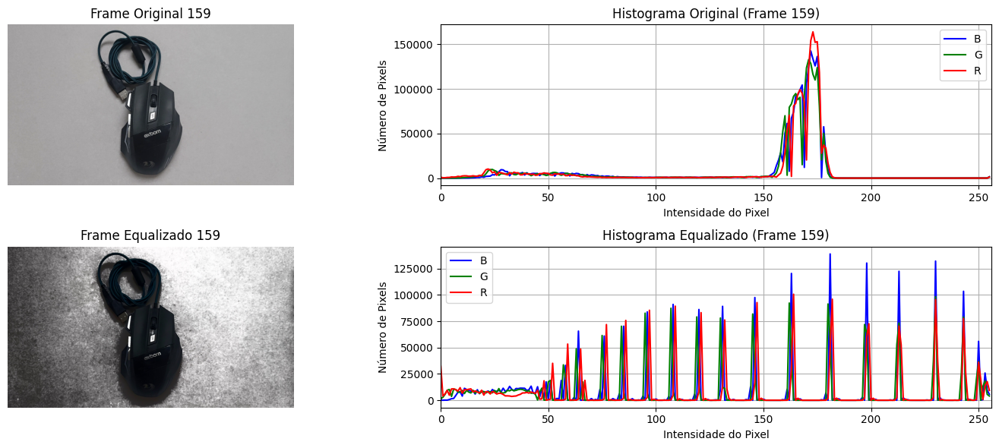


--- Plotando e analisando Frame 239 (Tempo: 23.90s) ---


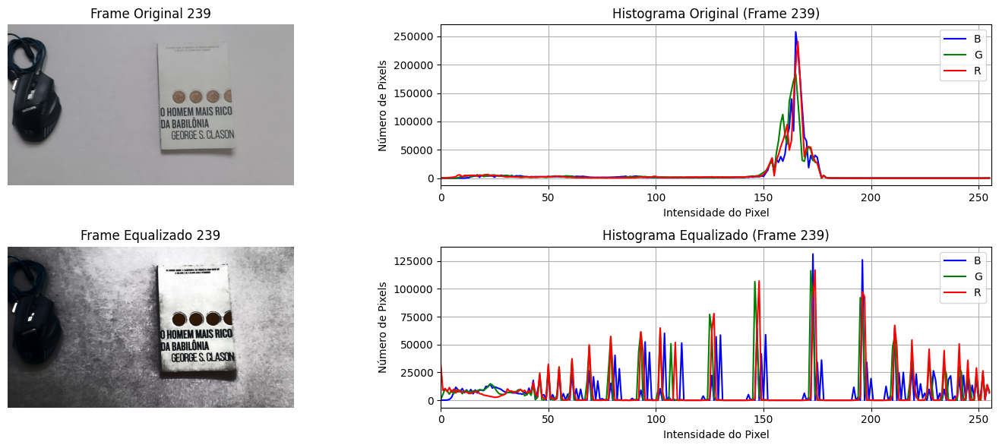


--- Plotando e analisando Frame 318 (Tempo: 31.80s) ---


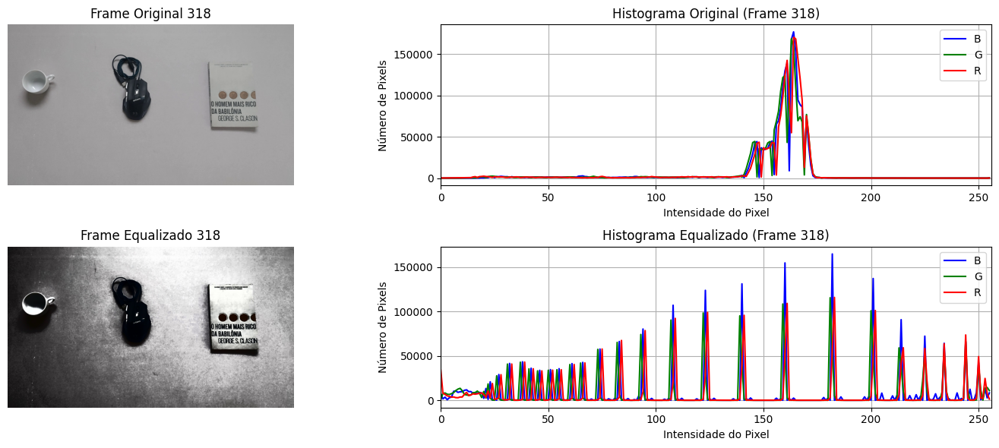


Análise e processamento de frames concluídos!
Imagens equalizadas salvas em: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/frames_equalized/
--- Etapa (c) Análise e Processamento de Imagens concluída! ---


In [ ]:
import cv2
import os
import sqlite3
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np

diretorio_base = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge"
diretorio_saida_frames = os.path.join(diretorio_base, "frames_fits/")
diretorio_saida_equalizadas = os.path.join(diretorio_base, "frames_equalized/")
db_caminho = os.path.join(diretorio_base, "data", "frames_metadata.db")

if not os.path.exists(diretorio_saida_equalizadas):
    os.makedirs(diretorio_saida_equalizadas)
    print(f"Diretório de saída para frames equalizados criado: {diretorio_saida_equalizadas}")

# Conecta ao banco de dados SQLite para ler os caminhos dos frames ---
try:
    conn = sqlite3.connect(db_caminho)
    cursor = conn.cursor()
    cursor.execute("SELECT caminho_fits, numero_frame, tempo_ms_video FROM frames ORDER BY numero_frame")
    frames_metadata = cursor.fetchall() # Obtém todos os metadados dos frames
    conn.close()
    print(f"Total de {len(frames_metadata)} frames encontrados no banco de dados para processamento.")
except Exception as e:
    print(f"ERRO: Não foi possível ler do banco de dados SQLite em {db_caminho}. Verifique a Célula 3. Erro: {e}")
    frames_metadata = [] # Garante que o loop não falhe se o DB não for acessível

# Função para calcular e plotar histograma ---
def plot_histogram(image, title="Histograma", channels=['B', 'G', 'R']):
    """
    Plota o histograma de uma imagem colorida no espaço BGR.

    Args:
        image (np.ndarray): Imagem no formato BGR.
        title (str): Título do gráfico.
        channels (list): Lista com os nomes dos canais de cor.
    """
    color = ('b','g','r')
    for i,col in enumerate(color):
        hist = cv2.calcHist([image],[i],None,[256],[0,256])
        plt.plot(hist,color = col, label=channels[i])
        plt.xlim([0,256])
    plt.title(title)
    plt.xlabel("Intensidade do Pixel")
    plt.ylabel("Número de Pixels")
    plt.legend()
    plt.grid(True)

# --- Processamento Principal ---
if not frames_metadata:
    print("Nenhum frame encontrado para processar. Finalizando etapa (c).")
else:
    frames_to_plot_indices = set([
        0,                                   
        len(frames_metadata) // 2,           
        len(frames_metadata) - 1       
    ])
    # Adicionar mais alguns frames espaçados se houver muitos
    if len(frames_metadata) > 100:
        frames_to_plot_indices.add(len(frames_metadata) // 4)
        frames_to_plot_indices.add(3 * len(frames_metadata) // 4)
    frames_to_plot_indices = sorted(list(frames_to_plot_indices))


    print(f"Iniciando análise e processamento de {len(frames_metadata)} frames...")
    print(f"Serão plotados os frames com os seguintes índices: {frames_to_plot_indices}")

    for i, (caminho_fits, numero_frame, tempo_ms_video) in enumerate(frames_metadata):
        if not os.path.exists(caminho_fits):
            print(f"Aviso: Arquivo FITS '{caminho_fits}' não encontrado. Pulando este frame.")
            continue

        try:
            # Leitura da imagem do arquivo FITS
            with fits.open(caminho_fits) as hdul:
                image_data_rgb = hdul[0].data

            image_bgr = cv2.cvtColor(image_data_rgb, cv2.COLOR_RGB2BGR)

            # Equalização de Histograma
            img_ycrcb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2YCrCb)
            y_channel = img_ycrcb[:,:,0]
            equalized_y_channel = cv2.equalizeHist(y_channel)
            img_ycrcb[:,:,0] = equalized_y_channel
            image_equalized_bgr = cv2.cvtColor(img_ycrcb, cv2.COLOR_YCrCb2BGR)
            image_equalized_rgb = cv2.cvtColor(image_equalized_bgr, cv2.COLOR_BGR2RGB) 

            # Salvar a imagem equalizada em um novo arquivo FITS
            nome_arquivo_equalizado_fits = f"frame_equalized_{numero_frame:05d}.fits"
            caminho_arquivo_equalizado_fits = os.path.join(diretorio_saida_equalizadas, nome_arquivo_equalizado_fits)
            hdu_equalized = fits.PrimaryHDU(image_equalized_rgb)
            
            # Copiar alguns metadados do original e adicionar os da equalização
            hdu_equalized.header = hdul[0].header.copy()
            hdu_equalized.header['EQ_PROC'] = True, 'Histogram Equalization applied'
            hdu_equalized.header['DATE_EQ'] = datetime.now().isoformat(), 'Date of equalization'
            hdu_equalized.writeto(caminho_arquivo_equalizado_fits, overwrite=True)


            # Plotar imagem original e equalizada com histogramas, se for um dos frames escolhidos
            if i in frames_to_plot_indices:
                print(f"\n--- Plotando e analisando Frame {numero_frame} (Tempo: {tempo_ms_video / 1000:.2f}s) ---")
                plt.figure(figsize=(15, 6))

                # Imagem Original
                plt.subplot(2, 2, 1)
                plt.imshow(image_data_rgb)
                plt.title(f'Frame Original {numero_frame}')
                plt.axis('off')
                
                # Histograma da Imagem Original
                plt.subplot(2, 2, 2)
                plot_histogram(image_bgr, title=f'Histograma Original (Frame {numero_frame})')

                # Imagem Equalizada e seu Histograma
                plt.subplot(2, 2, 3)
                plt.imshow(image_equalized_rgb)
                plt.title(f'Frame Equalizado {numero_frame}')
                plt.axis('off')

                # Histograma da Imagem Equalizada
                plt.subplot(2, 2, 4)
                plot_histogram(image_equalized_bgr, title=f'Histograma Equalizado (Frame {numero_frame})')

                plt.tight_layout()
                plt.show()

        except Exception as e:
            print(f"Erro ao processar o frame {numero_frame} do caminho '{caminho_fits}'. Erro: {e}")

    print("\nAnálise e processamento de frames concluídos!")
    print(f"Imagens equalizadas salvas em: {diretorio_saida_equalizadas}")

### Classificação Com Machine Learning


--- 1.1. Extraindo features das imagens com ResNet18 pré-treinada ---
Modelo ResNet18 carregado para o dispositivo: cpu


/var/data/python/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/var/data/python/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Extração de features e geração de rótulos verdadeiros concluídas. Total de 319 samples.
Dimensão das features: (319, 512)
Classes verdadeiras geradas: ['caneca' 'dois ou mais objetos' 'livro' 'mouse']

--- 2. Modelagem: Treinando o Classificador ---
Dados divididos: Treino=255 samples, Teste=64 samples.
Treinando SVM...
Treinamento do SVM concluído.

--- 3. Avaliação do Modelo ---

Relatório de Classificação:
                      precision    recall  f1-score   support

              caneca       1.00      1.00      1.00         7
dois ou mais objetos       1.00      1.00      1.00        40
               livro       1.00      1.00      1.00        10
               mouse       1.00      1.00      1.00         7

            accuracy                           1.00        64
           macro avg       1.00      1.00      1.00        64
        weighted avg       1.00      1.00      1.00        64


Matriz de Confusão:


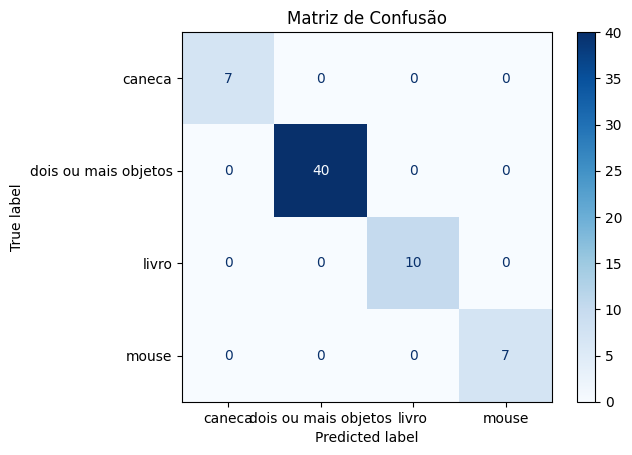


Análise de Capacidade Analítica (Interpretação da Matriz de Confusão e Performance):
---------------------------------------------------------------------------------
- **Acurácia Geral:** 1.00. Este valor indica a proporção total de predições corretas.
- **Classe 'caneca':** Precisão: 1.00, Recall: 1.00, F1-Score: 1.00.
- **Classe 'dois ou mais objetos':** Precisão: 1.00, Recall: 1.00, F1-Score: 1.00.
- **Classe 'livro':** Precisão: 1.00, Recall: 1.00, F1-Score: 1.00.
- **Classe 'mouse':** Precisão: 1.00, Recall: 1.00, F1-Score: 1.00.

- **Principais Confusões (observar a matriz):**

--- 4. Visualização de Exemplos de Classificação ---


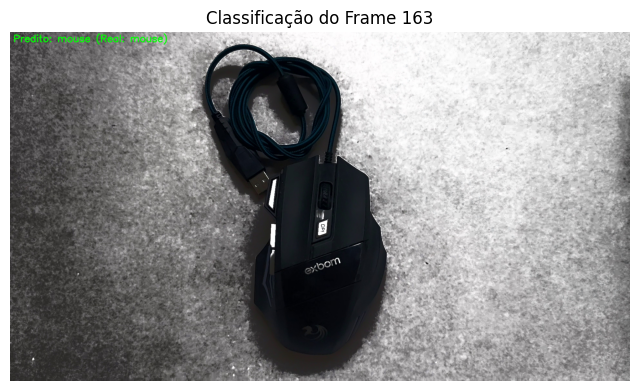

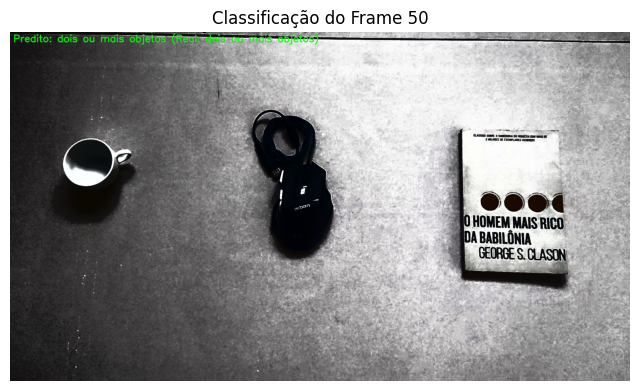

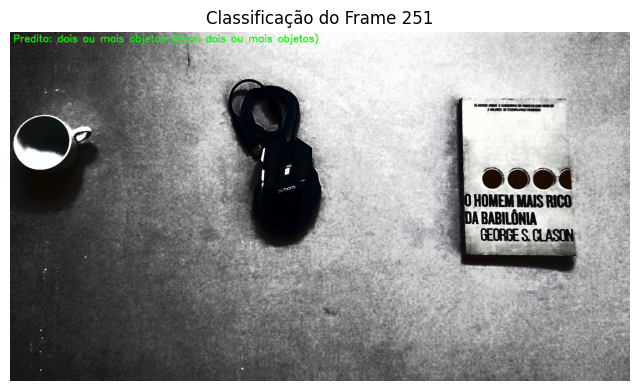

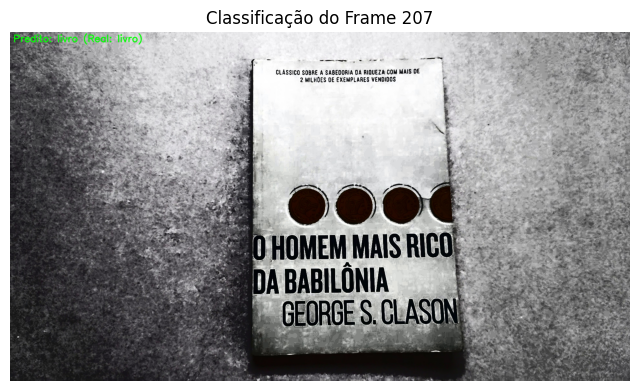

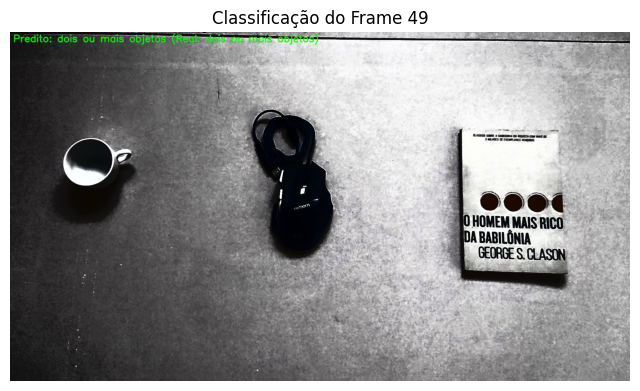

...

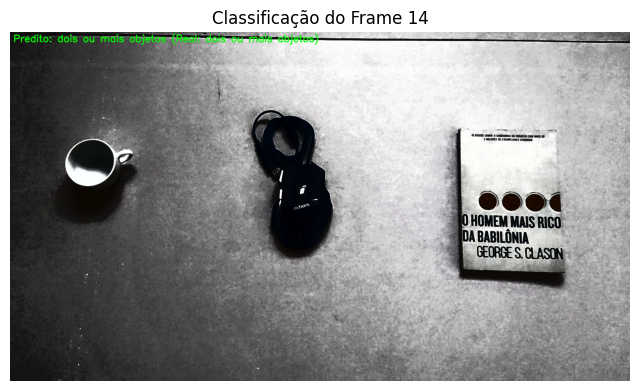

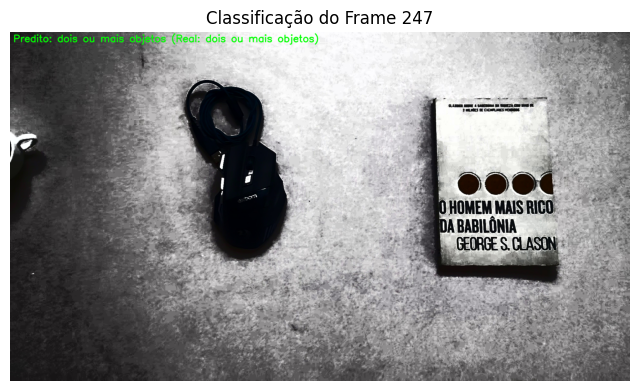

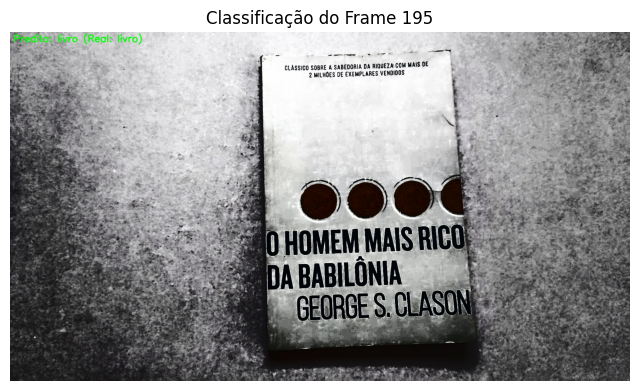

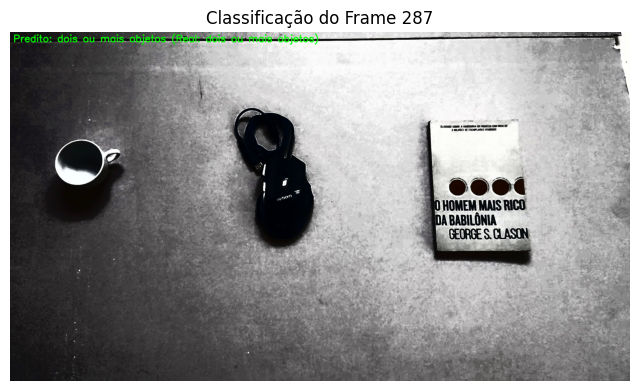

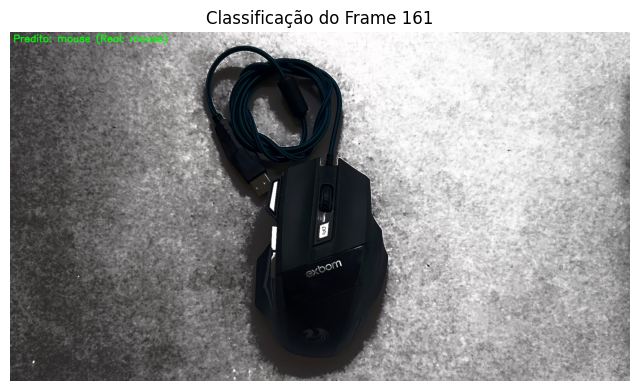

--- Etapa (d) Classificação com Machine Learning concluída! ---


In [2]:
import sqlite3
import numpy as np
import cv2
from astropy.io import fits
import matplotlib.pyplot as plt
from datetime import datetime
import torch
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
import os

diretorio_base = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge"
db_caminho = os.path.join(diretorio_base, "data", "frames_metadata.db")
diretorio_saida_equalizadas = os.path.join(diretorio_base, "data", "frames_equalized/")


# Engenharia de Features: Extração de Features de CNN e Geração de Rótulos Simplificados ---
print("\n--- 1.1. Extraindo features das imagens com ResNet18 pré-treinada ---")

# Carregar o modelo ResNet18 pré-treinado do PyTorch
model = models.resnet18(pretrained=True)
model = torch.nn.Sequential(*(list(model.children())[:-1]))
model.eval()

# Mover o modelo para GPU se disponível
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(f"Modelo ResNet18 carregado para o dispositivo: {device}")

# Transformações para a imagem (redimensionar, normalizar, converter para tensor)
preprocess = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

all_features = []
all_true_labels = []
processed_frame_indices = []

conn = sqlite3.connect(db_caminho)
cursor = conn.cursor()

# Carregar metadados dos frames para pegar os caminhos das imagens equalizadas
cursor.execute("SELECT numero_frame, caminho_fits FROM frames ORDER BY numero_frame")
all_frames_db_info = cursor.fetchall()
conn.close()

def get_true_label(frame_num):
    """
    Determina o rótulo verdadeiro com base no número do frame.
    
    Args:
        frame_num (int): Número do frame.
    
    Returns:
        str: Rótulo correspondente ao frame.
    """
    if 102 <= frame_num <= 134:
        return 'caneca'
    elif 144 <= frame_num <= 179:
        return 'mouse'
    elif 189 <= frame_num <= 237:
        return 'livro'
    else:
        return 'dois ou mais objetos' 
    
# Função para determinar o rótulo verdadeiro com base no número do frame
if not all_frames_db_info:
    print("ERRO: Nenhuma informação de frame encontrada no DB para extrair features.")
else:
    for i, (frame_num, original_fits_path) in enumerate(all_frames_db_info):
        true_label = get_true_label(frame_num)

        # Usamos as imagens equalizadas para extrair features
        nome_base_original = os.path.basename(original_fits_path)
        nome_base_equalizado = f"frame_equalized_{frame_num:05d}.fits"
        caminho_fits_equalizado = os.path.join(diretorio_saida_equalizadas, nome_base_equalizado)

        if not os.path.exists(caminho_fits_equalizado):
            print(f"Aviso: Arquivo FITS equalizado '{caminho_fits_equalizado}' não encontrado. Pulando frame {frame_num}.")
            continue
        try:
            with fits.open(caminho_fits_equalizado) as hdul:
                image_data_rgb = hdul[0].data # Imagem (já em RGB)

            # Converte para tensor e normaliza
            input_tensor = preprocess(image_data_rgb)
            input_batch = input_tensor.unsqueeze(0)

            # Mover o input para GPU se disponível
            input_batch = input_batch.to(device)

            with torch.no_grad():
                features = model(input_batch)

            # Achatar as features para um vetor 1D e converter para NumPy
            features_np = features.squeeze().cpu().numpy()
            all_features.append(features_np)
            all_true_labels.append(true_label)
            processed_frame_indices.append(frame_num)

        except Exception as e:
            print(f"Erro ao extrair features do frame {frame_num} (caminho: {caminho_fits_equalizado}). Erro: {e}")
   
    # Após a extração, converte as listas para arrays NumPy
    if len(all_features) > 0:
        all_features = np.array(all_features)
        all_true_labels = np.array(all_true_labels)
        processed_frame_indices = np.array(processed_frame_indices) 
        print(f"Extração de features e geração de rótulos verdadeiros concluídas. Total de {len(all_features)} samples.")
        print(f"Dimensão das features: {all_features.shape}")
        print(f"Classes verdadeiras geradas: {np.unique(all_true_labels)}")

        # Codificar os rótulos de texto para números para o Scikit-learn
        label_encoder = LabelEncoder()
        encoded_labels = label_encoder.fit_transform(all_true_labels)
        class_names = label_encoder.classes_ 

    else:
        print("Nenhuma feature foi extraída. Verifique os caminhos das imagens.")


# Modelagem: Escolha e Treinamento do Algoritmo de Machine Learning ---
print("\n--- 2. Modelagem: Treinando o Classificador ---")

if len(all_features) > 0:
    # Dividir os dados: features, rótulos codificados e os indices dos frames processados
    X_train, X_test, y_train_encoded, y_test_encoded, processed_frame_indices_train, processed_frame_indices_test = train_test_split(
        all_features, encoded_labels, processed_frame_indices, test_size=0.2, random_state=42, stratify=encoded_labels
    )
    print(f"Dados divididos: Treino={len(X_train)} samples, Teste={len(X_test)} samples.")

    # Treinamento do classificador SVM
    classifier = SVC(C=10, kernel='rbf', gamma='scale', random_state=42, probability=True)
    print("Treinando SVM...")
    classifier.fit(X_train, y_train_encoded)
    print("Treinamento do SVM concluído.")

    print("\n--- 3. Avaliação do Modelo ---")
    y_pred_encoded = classifier.predict(X_test)

    # Decodificar os rótulos para exibição
    y_test_decoded = label_encoder.inverse_transform(y_test_encoded)
    y_pred_decoded = label_encoder.inverse_transform(y_pred_encoded)

    print("\nRelatório de Classificação:")
    print(classification_report(y_test_decoded, y_pred_decoded, target_names=class_names))

    print("\nMatriz de Confusão:")
    # Plotar a matriz de confusão
    cm = confusion_matrix(y_test_encoded, y_pred_encoded, labels=classifier.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Matriz de Confusão")
    plt.show()

    print("\nAnálise de Capacidade Analítica (Interpretação da Matriz de Confusão e Performance):")
    print("---------------------------------------------------------------------------------")

    # Acurácia Geral
    overall_accuracy = np.mean(y_pred_encoded == y_test_encoded)
    print(f"- **Acurácia Geral:** {overall_accuracy:.2f}. Este valor indica a proporção total de predições corretas.")

    # Análise por classe (exemplo) - Adapte conforme os nomes das suas classes simuladas e o desempenho observado
    report_dict = classification_report(y_test_decoded, y_pred_decoded, target_names=class_names, output_dict=True)

    # Análise de cada classe
    for class_name in class_names:
        if class_name in report_dict:
            precision = report_dict[class_name]['precision']
            recall = report_dict[class_name]['recall']
            f1_score = report_dict[class_name]['f1-score']
            print(f"- **Classe '{class_name}':** Precisão: {precision:.2f}, Recall: {recall:.2f}, F1-Score: {f1_score:.2f}.")

    print("\n- **Principais Confusões (observar a matriz):**")  
    # Análise de confusões entre classes
    for i, true_class_idx in enumerate(classifier.classes_):
        for j, pred_class_idx in enumerate(classifier.classes_):
            if i != j and cm[i, j] > 0: # Se houver confusões
                true_class_name = class_names[true_class_idx]
                pred_class_name = class_names[pred_class_idx]
                num_confusions = cm[i, j]
                print(f"  - A classe real '{true_class_name}' foi classificada incorretamente como '{pred_class_name}' {num_confusions} vezes.")
else:
    print("Não há dados para treinar o modelo. Verifique os passos anteriores da extração de features.")


# --- 4. Visualização: Exemplos de Classificação ---
print("\n--- 4. Visualização de Exemplos de Classificação ---")

if len(X_test) > 0: #
    # Selecionar alguns exemplos aleatórios do conjunto de teste para visualizar
    num_examples_to_show = min(30, len(X_test)) 

    # Escolhe índices aleatórios do conjunto de teste
    random_indices_in_test_set = np.random.choice(len(X_test), num_examples_to_show, replace=False)

    # Iterar sobre os índices selecionados e exibir as imagens
    for i in random_indices_in_test_set:
        frame_num = processed_frame_indices_test[i] 
        predicted_label = y_pred_decoded[i]
        true_label = y_test_decoded[i]

        # Recria o caminho para a imagem equalizada para carregar
        nome_base_equalizado = f"frame_equalized_{frame_num:05d}.fits"
        caminho_fits_equalizado = os.path.join(diretorio_saida_equalizadas, nome_base_equalizado)

        if not os.path.exists(caminho_fits_equalizado):
            print(f"Aviso: Imagem equalizada para o frame {frame_num} não encontrada para visualização.")
            continue
        
        # Tenta abrir o arquivo FITS e exibir a imagem
        try:
            with fits.open(caminho_fits_equalizado) as hdul:
                image_to_display_rgb = hdul[0].data

            image_to_draw = cv2.cvtColor(image_to_display_rgb.copy(), cv2.COLOR_RGB2BGR)
            
            # Adicionar rótulo e status de classificação à imagem
            text = f"Predito: {predicted_label} (Real: {true_label})"
            color = (0, 255, 0) if predicted_label == true_label else (0, 0, 255)

            # Posição do texto (canto superior esquerdo)
            org = (10, 30)
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1
            thickness = 2
            
            # Adicionar texto à imagem
            cv2.putText(image_to_draw, text, org, font, font_scale, color, thickness, cv2.LINE_AA)

            # Exibir a imagem
            plt.figure(figsize=(8, 6))
            plt.imshow(cv2.cvtColor(image_to_draw, cv2.COLOR_BGR2RGB))
            plt.title(f"Classificação do Frame {frame_num}")
            plt.axis('off')
            plt.show()

        except Exception as e:
            print(f"Erro ao visualizar o frame {frame_num}. Erro: {e}")

else:
    print("Não há dados de teste para visualizar classificações ou o modelo não foi treinado.")

print("--- Etapa (d) Classificação com Machine Learning concluída! ---")

Modelo Faster R-CNN carregado com sucesso para o dispositivo: cpu

Iniciando detecção de objetos em 319 frames...
--- Plotando Detecções para Frame 13 ---


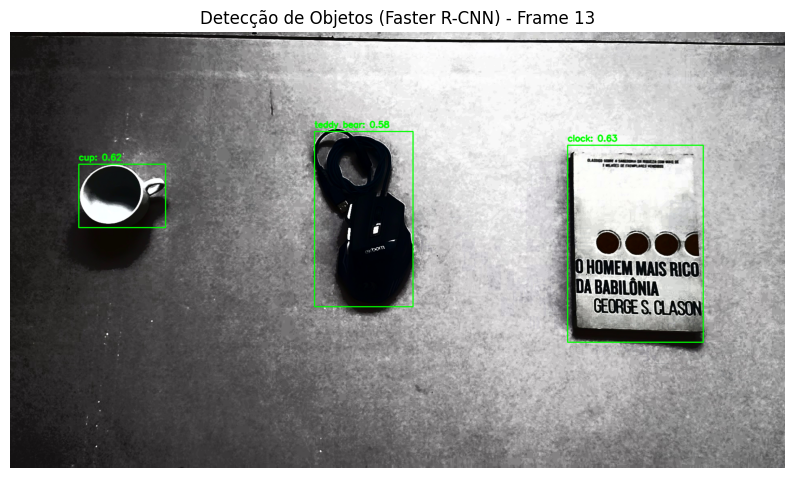

Objetos detectados no Frame 13: clock (0.63), cup (0.62), teddy bear (0.58)
--- Plotando Detecções para Frame 21 ---


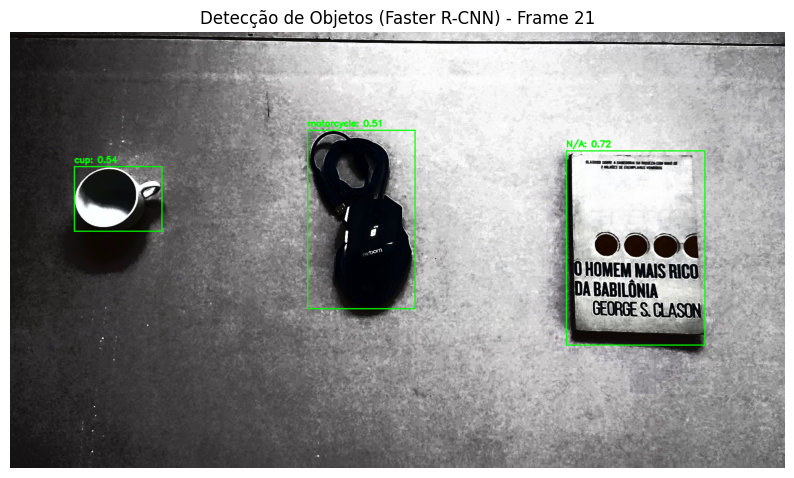

Objetos detectados no Frame 21: N/A (0.72), cup (0.54), motorcycle (0.51)
--- Plotando Detecções para Frame 29 ---


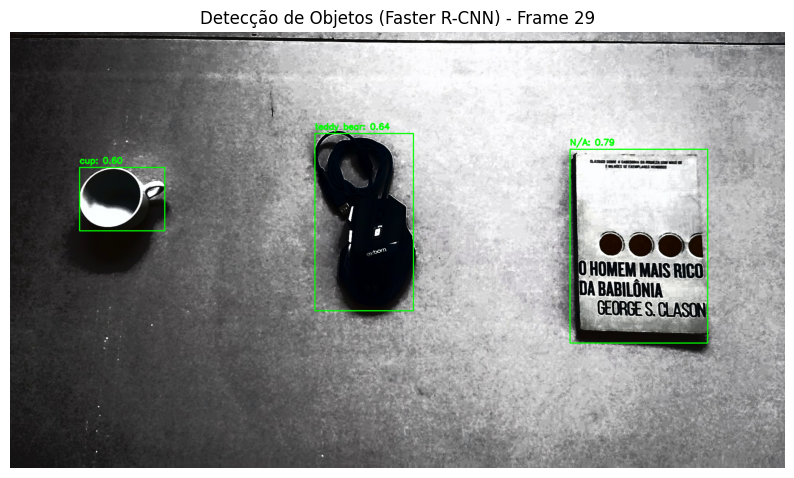

Objetos detectados no Frame 29: N/A (0.79), teddy bear (0.64), cup (0.60)
--- Plotando Detecções para Frame 38 ---


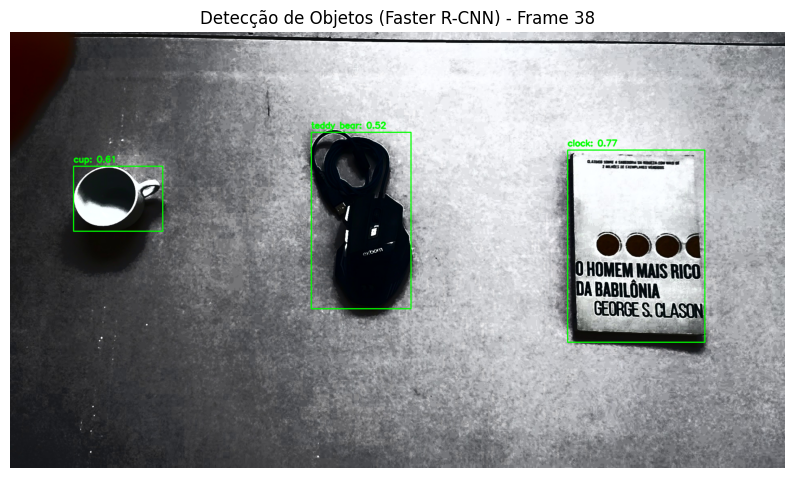

Objetos detectados no Frame 38: clock (0.77), cup (0.61), teddy bear (0.52)


In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
from astropy.io import fits
import numpy as np
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.transforms.functional import to_tensor

diretorio_base = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge"
diretorio_saida_equalizadas = os.path.join(diretorio_base, "data", "frames_equalized/")
diretorio_saida_detectados = os.path.join(diretorio_base, "data", "frames_detected_fasterrcnn/")

if not os.path.exists(diretorio_saida_detectados):
    os.makedirs(diretorio_saida_detectados)
    print(f"Diretório de saída para frames detectados (Faster R-CNN) criado: {diretorio_saida_detectados}")

# Carregar o Modelo Faster R-CNN Pré-treinado
try:
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)
    model.eval()

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    print(f"Modelo Faster R-CNN carregado com sucesso para o dispositivo: {device}")
except Exception as e:
    print(f"ERRO ao carregar o modelo Faster R-CNN: {e}")
    
# Lista de nomes de categorias do COCO (usada pelo Faster R-CNN)
# Esta lista é usada para mapear os índices de classe para nomes legíveis.
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'dog', 'cat', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog',
    'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
    'N/A', 'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse',
    'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
    'refrigerator', 'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear',
    'hair drier', 'toothbrush'
]


# Listar e Processar Frames Equalizados ---
frames_equalized_files = sorted([f for f in os.listdir(diretorio_saida_equalizadas) if f.endswith('.fits')])

if not frames_equalized_files:
    print(f"ERRO: Nenhuma imagem FITS equalizada encontrada em '{diretorio_saida_equalizadas}'.")
else:
    print(f"\nIniciando detecção de objetos em {len(frames_equalized_files)} frames...")
    
    # Definir quais frames serão plotados por número
    frames_to_plot_by_number = {13, 21, 29, 38}

    # Limiar de confiança para detecções
    CONFIDENCE_THRESHOLD = 0.5

    # Processar cada frame equalizado
    for i, filename in enumerate(frames_equalized_files):
        caminho_fits_equalizado = os.path.join(diretorio_saida_equalizadas, filename)
        
        # Tenta extrair o número do frame do nome do arquivo
        try:
            numero_frame = int(filename.split('_')[2].split('.')[0])
        except (IndexError, ValueError):
            print(f"Aviso: Não foi possível extrair o número do frame de '{filename}'. Pulando.")
            continue
        
        # Processar e Detectar Objetos 
        try:
            with fits.open(caminho_fits_equalizado) as hdul:
                image_data_rgb = hdul[0].data

            input_tensor = to_tensor(image_data_rgb).to(device)
            input_batch = [input_tensor]

            with torch.no_grad():
                predictions = model(input_batch)
                
            # Extrair caixas, rótulos e scores das detecções
            boxes = predictions[0]['boxes'].cpu().numpy()
            labels = predictions[0]['labels'].cpu().numpy()
            scores = predictions[0]['scores'].cpu().numpy()

            image_with_boxes = cv2.cvtColor(image_data_rgb.copy(), cv2.COLOR_RGB2BGR)

            detected_objects_info = []
            # Desenhar caixas delimitadoras e rótulos na imagem
            for box, label_idx, score in zip(boxes, labels, scores):
                if score > CONFIDENCE_THRESHOLD:
                    x1, y1, x2, y2 = map(int, box)
                    class_name = COCO_INSTANCE_CATEGORY_NAMES[label_idx]

                    color = (0, 255, 0)
                    thickness = 2
                    font = cv2.FONT_HERSHEY_SIMPLEX
                    font_scale = 0.7

                    cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), color, thickness)
                    text = f"{class_name}: {score:.2f}"
                    text_y_pos = y1 - 10 if y1 - 10 > 10 else y1 + 20
                    cv2.putText(image_with_boxes, text, (x1, text_y_pos), font, font_scale, color, thickness, cv2.LINE_AA)

                    detected_objects_info.append(f"{class_name} ({score:.2f})")
            
            image_with_boxes_rgb = cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB)
            
            # Salvar a imagem com detecções
            output_filename = filename.replace('.fits', '_detected_fasterrcnn.png')
            caminho_saida_detectado = os.path.join(diretorio_saida_detectados, output_filename)
            cv2.imwrite(caminho_saida_detectado, image_with_boxes)

            # Plotar apenas se o numero_frame estiver na lista desejada
            if numero_frame in frames_to_plot_by_number:
                print(f"--- Plotando Detecções para Frame {numero_frame} ---")
                plt.figure(figsize=(10, 8))
                plt.imshow(image_with_boxes_rgb)
                plt.title(f'Detecção de Objetos (Faster R-CNN) - Frame {numero_frame}')
                plt.axis('off')
                plt.show()

                if detected_objects_info:
                    print(f"Objetos detectados no Frame {numero_frame}: {', '.join(detected_objects_info)}")
                else:
                    print(f"Nenhum objeto detectado no Frame {numero_frame} (confiança > {CONFIDENCE_THRESHOLD}).")

        except Exception as e:
            print(f"Erro ao processar e detectar objetos no frame '{filename}'. Erro: {e}")

### Análise de Áudio

In [ ]:
import os
from transformers import pipeline
import torch

diretorio_base = "/home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge"
audio_input_path = os.path.join(diretorio_base, "data", "VID_20250728_163611_audio_only.aac")

if not os.path.exists(audio_input_path):
    print(f"ERRO: O arquivo de áudio '{audio_input_path}' não foi encontrado.")
    print("Por favor, verifique se a Célula 2 foi executada corretamente e se o caminho está certo.")
else:
    print(f"Arquivo de áudio encontrado: {audio_input_path}")
    
    # 
    try:
        # Carrega o pipeline de transcrição automática de fala
        transcriber = pipeline("automatic-speech-recognition", model="openai/whisper-base", device=0 if torch.cuda.is_available() else -1)

        # Realiza a transcrição do arquivo de áudio
        print("\nIniciando a transcrição do áudio...")
        transcription_result = transcriber(audio_input_path, return_timestamps="word")

        print("\n--- Resultado da Transcrição ---")
        print(transcription_result["text"])

    except Exception as e:
        print(f"ERRO durante a transcrição: {e}")

Arquivo de áudio encontrado: /home/thiagosrx/Documentos/code/artificial_intelligence_analyst-_challenge/data/VID_20250728_163611_audio_only.aac


Device set to use cpu



Iniciando a transcrição do áudio...

--- Resultado da Transcrição ---
 Olá, nós iremos capturar dados visuais e sonoros de uma cena simples. Aqui nós temos uma caneca na col branca de cerâmica. Aqui nós temos um maus em preto. E aqui nós temos um livro na cor cinza de capa malhava. E aqui nós temos três itens, facilmente identificáveis para o nosso projeto.
